# Gait Recognition System

In [5]:
import cv2
import pickle
import numpy as np
import pandas as pd
import tensorflow as tf
import pyrealsense2 as rs
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from mpl_toolkits.mplot3d.axes3d import Axes3D
from sklearn.metrics import accuracy_score
from scipy.fft import fft, fftfreq
from operator import itemgetter
from celluloid import Camera
from tqdm import tqdm
import os

## 1. Data Visualization

### This step requires two files (.pkl and its corresponding raw .bag recording)
### It loads the pre-processed link information from RealSense recording
### The pre-processed files (.pkl) are generated using separate script (extract_rsbag.py)

In [6]:
# load openpose links and 3D links
# these .pkl file are data extracted from rgbd recording (.bag files)

with open('person1.pkl', 'rb') as f:
    results, dfs = pickle.load(f)
# for k, v in results.items():
#     print(k)
for k, v in dfs.items():
    print(k)

20210520_222743.bag
20210520_222920.bag
20210520_222950.bag
20210520_223018.bag
20210520_223044.bag
20210520_223107.bag
20210520_223133.bag
20210520_223224.bag
20210520_223159.bag
20210520_223259.bag
20210520_223324.bag


In [7]:
# choose .bag file from folder for viewing and checking

rsbag = '20210520_222950.bag'
folder = 'person1'

In [8]:
# load .bag file to var <q>

q, t = [], []
config = rs.config()
config.enable_device_from_file(os.path.join(folder, rsbag), repeat_playback=False)
pipeline = rs.pipeline()
profile = pipeline.start(config)
playback = profile.get_device().as_playback()
playback.set_real_time(False)
duration = playback.get_duration().seconds * 1E9
duration += playback.get_duration().microseconds * 1E3
duration = round(duration/1E6)
pbar = tqdm(total=duration, position=0, leave=True)
colorizer = rs.colorizer()
# align = rs.align(rs.stream.color)
align = rs.align(rs.stream.depth)
# depth_filter = rs.decimation_filter()       # reduce resolution
# depth_filter = rs.disparity_transform()     # disparity domain
depth_filter = rs.spatial_filter()          # edge
# depth_filter = rs.temporal_filter()         # from sequence
is_present, frames = pipeline.try_wait_for_frames()
elapsed = 0
while is_present:
    ts = frames.timestamp
    if ts in t:
        is_present, frames = pipeline.try_wait_for_frames()
        continue
    playback.pause()
    period = int(playback.get_position()/1E6) - elapsed
    pbar.update(period)
    elapsed += period
    t.append(ts)
    frames = align.process(frames)
    color_frame = frames.get_color_frame()
    color_image = np.asanyarray(color_frame.get_data())
    # color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)
    depth_frame = frames.get_depth_frame()
    depth_frame = depth_filter.process(depth_frame)
    depth_image = colorizer.colorize(depth_frame)
    depth_image = np.asanyarray(depth_image.get_data())
    # .copy() is critical
    q.append([ts,
                color_image.copy(), 
                np.asanyarray(depth_frame.get_data()).copy(), 
                depth_image.copy()])
    playback.resume()
    is_present, frames = pipeline.try_wait_for_frames()
pbar.update(duration-elapsed)
pbar.close()
pipeline.stop()

intrinsics = color_frame.profile.as_video_stream_profile().intrinsics

100%|███████████████████████████████████████████████████████████████████████████| 12546/12546 [00:25<00:00, 501.02it/s]


In [9]:
# find match from link file (.pkl), store in <processed>

pclr = {}
clr = [[0, 255, 0], [0, 255, 255], [0, 0, 255], 
       [0, 255, 0], [0, 255, 255], [0, 0, 255], 
       [255, 0, 0], [255, 255, 0], [255, 0, 255], 
       [255, 0, 0], [255, 255, 0], [255, 0, 255], ]

p = results[rsbag]

ts = set(map(itemgetter(0), p)).intersection(set(map(itemgetter(0), q)))
ts = sorted(list(ts))
_p, _q = p[:], q[:]
processed = []
for idx, t in tqdm(enumerate(ts), position=0, leave=True):
    ts_plink, plink, plink3d, centers = _p.pop(0)
    while t != ts_plink:
        ts_plink, plink, plink3d, centers = _p.pop(0)
    ts_rsbag, color, depth, colorized = _q.pop(0)
    while t != ts_rsbag:
        ts_rsbag, color, depth, colorized = _q.pop(0)

    if plink is None:
        continue

    skel = color.copy()
    for person, links in plink.items():
        for i, link in enumerate(links):
            (w0, h0), (w1, h1) = link
            if 0 in [w0, h0, w1, h1]:
                continue
            cv2.line(skel, (w0, h0), (w1, h1), clr[i], 3, cv2.LINE_AA)
    processed.append((t, plink3d, skel.copy(), colorized.copy()))

189it [00:00, 699.13it/s]


In [10]:
# view information from bag and pkl combined

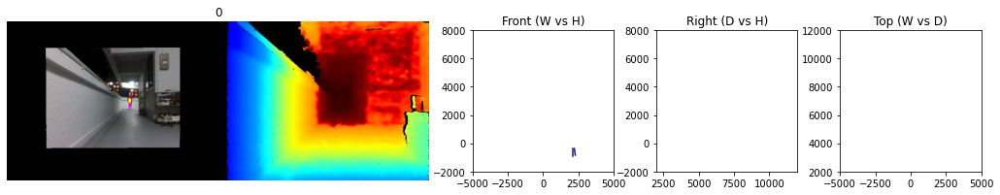

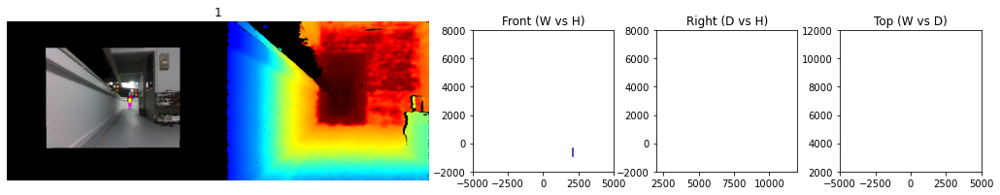

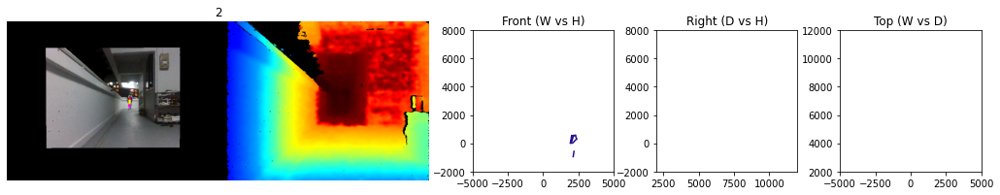

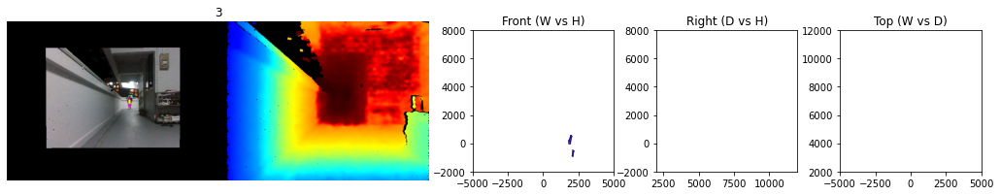

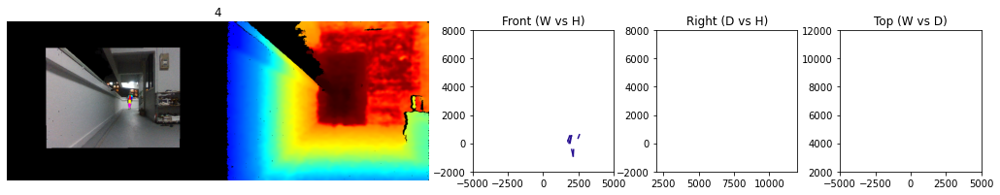

...

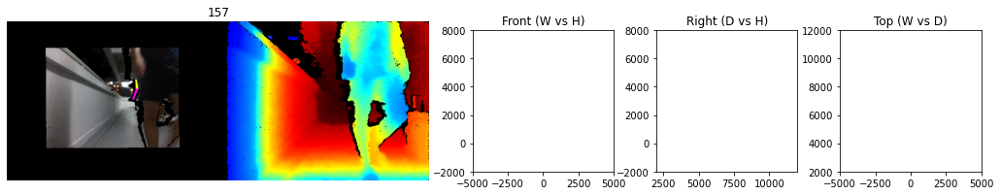

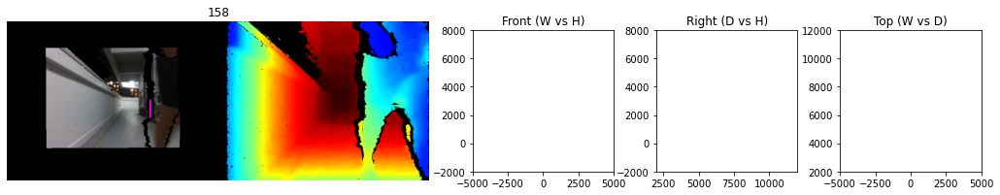

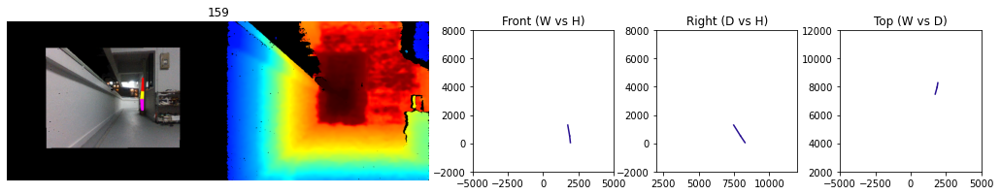

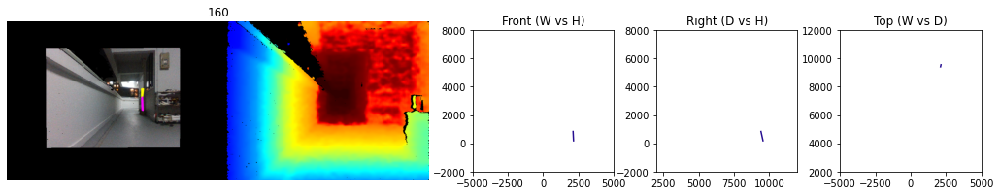

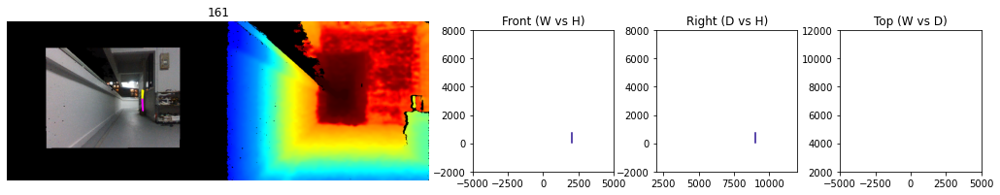

In [11]:
clr = [np.random.uniform(0, 1, 3) for _ in range(10)]
limb_length = 1000

for idx, (t, persons, skel, colorized) in enumerate(processed):
    fig, axes = plt.subplots(1, 4, figsize=(18,3), gridspec_kw={'width_ratios': [3, 1, 1, 1]})
    axes[1].set_title('Front (W vs H)')
    axes[1].set_aspect('equal')
    # axes[1].set_xlabel('width')
    # axes[1].set_ylabel('height')
    axes[1].set_xlim([-5000, 5000])
    axes[1].set_ylim([-2000, 8000])
    axes[2].set_title('Right (D vs H)')
    axes[2].set_aspect('equal')
    # axes[2].set_xlabel('depth')
    # axes[2].set_ylabel('height')
    axes[2].set_xlim([2000, 12000])
    axes[2].set_ylim([-2000, 8000])
    axes[3].set_title('Top (W vs D)')
    axes[3].set_aspect('equal')
    # axes[3].set_xlabel('width')
    # axes[3].set_ylabel('depth')
    axes[3].set_xlim([-5000, 5000])
    axes[3].set_ylim([2000, 12000])
    for person, links in persons.items():
        if person != 0:
            continue
        for i, ((x0, y0, z0), (x1, y1, z1)) in enumerate(links):
            if sum([x0, y0, z0, x1, y1, z1]) == 0:
                continue
            if np.linalg.norm([x1-x0, y1-y0, z1-z0]) > limb_length:
                continue
            axes[1].plot((x0, x1), (-y0, -y1), c=clr[person])
            axes[2].plot((z0, z1), (-y0, -y1), c=clr[person])
            axes[3].plot((x0, x1), (z0, z1), c=clr[person])
    stacked = np.hstack((skel, colorized))
    axes[0].set_title(idx)
    axes[0].imshow(stacked)
    axes[0].axis('off')
    plt.show();

In [12]:
# stickman 3D view of the same recording

In [16]:
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.axes3d import Axes3D
from celluloid import Camera

font = {'family' : 'normal',
        # 'weight' : 'bold',
        'size'   : 12}

matplotlib.rc('font', **font)

In [18]:
%matplotlib ipympl

fig = plt.figure()
ax = Axes3D(fig)

ax.set_xlim3d([-2500, 2500])
ax.set_ylim3d([0, 20000])
ax.set_zlim3d([-1000, 4000])
ax.set_xlabel('Width')
ax.set_ylabel('Depth')
ax.set_zlabel('Height')
ax.set_title('Stickman')
# ax.view_init(30, 105)

clr, data = {}, {}
camera = Camera(fig)
for t, plink3d, skel, colorized in processed:
    # if plink3d is None:
    #     continue
    for person, links in plink3d.items():
        if person not in clr and person not in data:
            clr[person] = np.random.uniform(0, 1, 3)
            data[person] = []
        frame_links = []
        for (x0, y0, z0), (x1, y1, z1) in links:
            ax.plot([x0, x1], [z0, z1], [-y0, -y1], color=clr[person])
            frame_links.append([t, x0, y0, z0, x1, y1, z1])
        data[person].append(frame_links)
    camera.snap()
animation = camera.animate()

FigureCanvasNbAgg()

MovieWriter imagemagick unavailable; using Pillow instead.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


IndexError: list index out of range

In [16]:
%matplotlib inline

animation.event_source.stop()

### Observe that the stickman do not render well at further distance (depth is high)
### This is coherent from the recording, and it affects the availability of links (stickman limb) as datapoint later

## 2. Gait Classification Training and Prediction Accuracy

In [17]:
# helper functions
# these functions convert pre-processed data in .pkl to dataset

def create_signal(dfs, fps=15, n_column=12, ax='Y', nan_thresh=6, stride=15, period=45):
    signals = {i: [] for i in range(n_column*2)}
    for rsbag, df in dfs.items():
        for person, (rot, ang) in df.items():
            rot_clean = clean_df(rot, fps, n_column, ax, nan_thresh)
            if rot_clean is None:
                continue
            # signals is pass by reference
            rot_df_to_signal(rot_clean, signals, stride, period)
            ang_clean = clean_df(ang.drop(columns=['DST']), fps, n_column, ax, nan_thresh)
            ang_df_to_signal(ang_clean, signals, stride, period, n_column)
    return signals

def ang_df_to_signal(df, signals, stride, period, n_column):
    # create subsets, then fft them
    x_all = df.to_numpy()
    n_sample = (x_all.shape[0] - (period - stride)) // stride
    for start in range(n_sample):
        xs = x_all[-(start*stride)-1-period:-(start*stride)-1].T
        for i, x in enumerate(xs):
            yf = fft(x)
            if not np.all(np.isnan(yf)):
                signals[n_column+i].append(yf)
    return

def rot_df_to_signal(df, signals, stride, period):
    # create subsets, then fft them
    x_all = df.to_numpy()
    n_sample = (x_all.shape[0] - (period - stride)) // stride
    for start in range(n_sample):
        xs = x_all[-(start*stride)-1-period:-(start*stride)-1,:].T
        for i, x in enumerate(xs):
            yf = fft(x)
            if not np.all(np.isnan(yf)):
                signals[i].append(yf)
    return signals

def clean_df(data, fps, n_column, ax, nan_thresh):
    # convert index to nanoseconds, then to n-period
    idx = data.index.to_numpy().astype(np.float64)
    idx = np.round(idx/(1E9/fps)).astype(np.int32) - 1
    idx = idx[idx>=0]
    if idx.shape[0] == 0:
        return None
    # fill df from data
    try:
        df = pd.DataFrame(index=np.arange(idx[-1]+1), columns=data.columns.droplevel(1)[:n_column])
    except IndexError:
        df = pd.DataFrame(index=np.arange(idx[-1]+1), columns=data.columns)
    if df.shape[0] == 0:
        return None
    try:
        df.loc[idx] = data.loc[:, (slice(None), ax)].to_numpy()
    except TypeError:
        df.loc[idx] = data.to_numpy()
    # clip nan out of head and tail
    head, tail = None, None
    for i in range(df.shape[0]):
        if head is None:
            unq, cts = np.unique(df.iloc[i].isna(), return_counts=True)
            if cts[unq] <= nan_thresh:
                head = i
        if tail is None:
            unq, cts = np.unique(df.iloc[-i].isna(), return_counts=True)
            if cts[unq] <= nan_thresh:
                tail = i
        if tail is not None and head is not None:
            break
    else:
        return None
    df = df.iloc[head:-tail]
    return df

In [18]:
# load files containing dataframes of observation, then store as dictionary, key: person index
period = 30                 # length of each subset of raw signal
stride = 15                 # stride of scanning of raw signal
n_population = 1000         # total number of training and test datapoints
rsbagfiles = ['person1.pkl', 'person2.pkl', 'person3.pkl', 'person4.pkl', 'person5.pkl']
# the recording is at 15 fps, period 30 is 2 seconds

dataset = {}
for i, fn in enumerate(rsbagfiles):
    i += 1
    with open(fn, 'rb') as f:
        # load observation for a person
        _, dfs = pickle.load(f)
        # dfs (dictionary) contains observation video from .bag files (as dict key) for a particular person
        # each dictionary element of dfs has another dictionary of pose detection (as key)
        # each pose detection has pair of tuple of link rotation and link angle (dataframes)
        # the dataframes do not have uniform length
    # create_signal function extracts the dataframe pairs and segment them as a uniform length signal (30 period, 15 stride)
    # period will be the second dimension of data
    # create_signal transforms each subset from time domain using fft into frequency response signal (frequency domain)
    # using one axis 'Y' only as it is the up-down movement in real world
    # this up-down movement is supposed to be always similar in pattern in any walking direction
    dataset[i] = create_signal(dfs, ax='Y', period=period, stride=stride)

C:\Users\tzy\anaconda3\envs\sensing\lib\site-packages\ipykernel_launcher.py:68: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


In [65]:
# explore the dataframe if desired

for results, persons in dfs.items():
    for person, (rot, ang) in persons.items():
        print(rot, ang)

NaN       NaN       NaN  
0 days 00:00:00.133455566  0.976188 -0.150182 -0.156534  
0 days 00:00:00.200148682 -0.379770 -0.553832  0.740976  
0 days 00:00:00.266676024 -0.988954  0.000000  0.148222  
0 days 00:00:00.333770508       NaN       NaN       NaN  
...                             ...       ...       ...  
0 days 00:00:12.008111083       NaN       NaN       NaN  
0 days 00:00:12.075915527 -0.996696  0.078278  0.021665  
0 days 00:00:12.141921143       NaN       NaN       NaN  
0 days 00:00:12.208649902       NaN       NaN       NaN  
0 days 00:00:12.275560303  0.555392  0.100503  0.825493  

[184 rows x 36 columns]                                DST  RSH  RUA       RLA       LSH       LUA  \
0 days 00:00:00.066238280  17748.0  NaN  NaN  0.088377       NaN       NaN   
0 days 00:00:00.133455566  18009.0  NaN  NaN  0.809300       NaN       NaN   
0 days 00:00:00.200148682  17501.5  NaN  NaN       NaN       NaN       NaN   
0 days 00:00:00.266676024  17748.0  NaN  NaN       NaN   

In [19]:
# re-arrange dataset and remove links that do not have data
to_remove = [2, 4, 5, 14, 16, 17]   # <--- remove links here
link_nums = set([i for i in range(24)]) - set(to_remove)
link_nums = {ln:i for i, ln in enumerate(link_nums)}
# link_nums determine the first dimension
# link_nums is the openpose link information 12 rotation axes, 12 rotation angles as signals

temp, missing_links = {}, []
for person, signals in dataset.items():
    for k, v in signals.items():
        if len(v) == 0:
            missing_links.append(k)
            continue
        if k in link_nums:
            if person not in temp:
                temp[person] = [[] for _ in range(len(link_nums))]
            temp[person][link_nums[k]].extend(v)
print('ensure these links', set(missing_links), 'are not inside link_nums')
# some links may have np.nan (no data) as shown by stickman, remove them
# update to_remove var then run this cell again
# this reduces the first dimension

ensure these links {2, 4, 5, 14, 16, 17} are not inside link_nums


In [26]:
# bagging from dataset
n_data = [0]
while np.sum(n_data) != n_population:
    # ensure there is 1000 datapoints
    n_data = np.around(np.random.dirichlet(np.ones(len(rsbagfiles)))*n_population).astype(np.int32)

# randomly mix and match links to enrich training and test data
persons = {}
for person, link_data in temp.items():
    link_lens = [len(ld) for ld in link_data]
    print('valid number of datapoints for each link respectively:', link_lens)
    if 0 in link_lens:
        persons[person] = np.array([])
        continue
    person_dataset = []
    for _ in range(n_data[person-1]):
        one_set = [temp[person][i][np.random.randint(0, link_len)] for i, link_len in enumerate(link_lens)]
        person_dataset.append(one_set)
    persons[person] = np.array(person_dataset)

valid number of datapoints for each link respectively: [17, 10, 15, 15, 30, 46, 15, 32, 44, 14, 8, 13, 12, 27, 37, 12, 28, 36]
valid number of datapoints for each link respectively: [16, 3, 12, 13, 20, 23, 12, 20, 24, 12, 1, 11, 8, 13, 22, 8, 14, 19]
valid number of datapoints for each link respectively: [7, 3, 4, 5, 19, 20, 5, 19, 25, 6, 3, 5, 5, 19, 22, 5, 18, 24]
valid number of datapoints for each link respectively: [8, 5, 8, 13, 26, 33, 13, 27, 32, 4, 5, 3, 5, 16, 21, 5, 13, 20]
valid number of datapoints for each link respectively: [6, 5, 4, 3, 33, 32, 4, 34, 37, 6, 5, 4, 3, 34, 36, 4, 35, 38]


In [27]:
# prepare label
X, y = [], []
for k, v in persons.items():
    print('person', k, 'bagged datapoints and shape', np.array(v).shape)
    X.extend(v)
    y.extend([k for _ in range(len(v))])
X, y = np.array(X), np.array(y).reshape(-1, 1)
y = OneHotEncoder().fit_transform(y).toarray().astype(np.int32)
# check the bagging quantity from each person, total number is defined in n_population
# repeat previous cell execution to randomly generate different mix until satisfied

person 1 bagged datapoints and shape (27, 18, 30)
person 2 bagged datapoints and shape (410, 18, 30)
person 3 bagged datapoints and shape (283, 18, 30)
person 4 bagged datapoints and shape (158, 18, 30)
person 5 bagged datapoints and shape (122, 18, 30)


In [28]:
X.shape, y.shape

((1000, 18, 30), (1000, 5))

In [29]:
# split for test and train
# 20 % for test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [30]:
# model definition
# using audio recognition model, as gait information has similar characteristics as audio (has frequency)
# https://keras.io/examples/audio/speaker_recognition_using_cnn/

input_shape = (len(link_nums), period)

def residual_block(x, filters, conv_num=3, activation="relu"):
    # Shortcut
    s = tf.keras.layers.Conv1D(filters, 1, padding="same")(x)
    for i in range(conv_num - 1):
        x = tf.keras.layers.Conv1D(filters, 3, padding="same")(x)
        x = tf.keras.layers.Activation(activation)(x)
    x = tf.keras.layers.Conv1D(filters, 3, padding="same")(x)
    x = tf.keras.layers.Add()([x, s])
    x = tf.keras.layers.Activation(activation)(x)
    return tf.keras.layers.MaxPool1D(pool_size=2, strides=2)(x)

def build_model(input_shape, num_classes):
    inputs = tf.keras.layers.Input(shape=input_shape, name="input")

    x = residual_block(inputs, 16, 2)
    x = residual_block(x, 32, 2)
    # x = residual_block(x, 64, 3)
    # x = residual_block(x, 128, 3)
    # x = residual_block(x, 128, 3)

    x = tf.keras.layers.AveragePooling1D(pool_size=3, strides=3)(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(256, activation="relu")(x)
    # x = tf.keras.layers.Dense(128, activation="relu")(x)
    x = tf.keras.layers.Dense(64, activation="relu")(x)

    outputs = tf.keras.layers.Dense(num_classes, activation="softmax", name="output")(x)

    return tf.keras.models.Model(inputs=inputs, outputs=outputs)

model = build_model(input_shape, len(rsbagfiles))

model.summary()

# Compile the model using Adam's default learning rate
model.compile(
    optimizer="Adam", loss="categorical_crossentropy", metrics=["accuracy"]
)

# Add callbacks:
# 'EarlyStopping' to stop training when the model is not enhancing anymore
# 'ModelCheckPoint' to always keep the model that has the best val_accuracy
model_save_filename = "model.h5"

# earlystopping_cb = tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)
# mdlcheckpoint_cb = tf.keras.callbacks.ModelCheckpoint(
#     model_save_filename, monitor="val_accuracy", save_best_only=True
# )

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 18, 30)]     0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 18, 16)       1456        input[0][0]                      
__________________________________________________________________________________________________
activation (Activation)         (None, 18, 16)       0           conv1d_1[0][0]                   
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 18, 16)       784         activation[0][0]                 
______________________________________________________________________________________________

In [81]:
tf.keras.utils.plot_model(
    model, to_file='model.png', 
    show_layer_names=False, rankdir='TB', expand_nested=False, dpi=96
)

Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.


In [32]:
# training

history = model.fit(
    X_train, 
    y_train,
    epochs=10,
    validation_data=(X_test, y_test),
    # callbacks=[earlystopping_cb, mdlcheckpoint_cb],
)

# start to overfit after around 10 epochs
# could be due to the number of class (person) or observation is not rich enough

Train on 800 samples, validate on 200 samples
Epoch 1/10
800/800 [==============================] - 3s 4ms/sample - loss: 1.1309 - accuracy: 0.6200 - val_loss: 0.7789 - val_accuracy: 0.7000
Epoch 2/10
800/800 [==============================] - 0s 97us/sample - loss: 0.5785 - accuracy: 0.7887 - val_loss: 0.3344 - val_accuracy: 0.9100
Epoch 3/10
800/800 [==============================] - 0s 98us/sample - loss: 0.2573 - accuracy: 0.9362 - val_loss: 0.1683 - val_accuracy: 0.9400
Epoch 4/10
800/800 [==============================] - 0s 100us/sample - loss: 0.1058 - accuracy: 0.9750 - val_loss: 0.0981 - val_accuracy: 0.9800
Epoch 5/10
800/800 [==============================] - 0s 110us/sample - loss: 0.0474 - accuracy: 0.9912 - val_loss: 0.0527 - val_accuracy: 0.9900
Epoch 6/10
800/800 [==============================] - 0s 107us/sample - loss: 0.0251 - accuracy: 0.9950 - val_loss: 0.0391 - val_accuracy: 0.9900
Epoch 7/10
800/800 [==============================] - 0s 105us/sample - loss: 0.01

In [33]:
# prediction

y_pred = model.predict(X_test)

In [34]:
# determines accuracy scores

maxim = np.max(y_pred, axis=1)
maxim = np.tile(maxim, (5, 1)).T
y_pred = (y_pred==maxim).astype(np.int32)

acc = accuracy_score(y_test, y_pred)
print('final accuracy score is:', f"{int(acc*100)} %")

final accuracy score is: 98 %


## 3. Exploration of Raw Data

### This section explains the properties of gait as captured and stored in .bag files
### In the nutshell, it explains what the extract_rsbag.py script does to create dataframe

In [35]:
with open('person1.pkl', 'rb') as f:
    results, dfs = pickle.load(f)
# for k, v in results.items():
#     print(k)
for k, v in dfs.items():
    print(k)

20210520_222743.bag
20210520_222920.bag
20210520_222950.bag
20210520_223018.bag
20210520_223044.bag
20210520_223107.bag
20210520_223133.bag
20210520_223224.bag
20210520_223159.bag
20210520_223259.bag
20210520_223324.bag


In [36]:
# select to view raw data from which recording

rsbag = '20210520_223107.bag'

In [37]:
# helper function

def get_df(datum):
    # convert links to unit vectors
    vectors, timestamp, distance = [], [], []
    for links in datum:
        frame_vector = []
        for link in links:
            t, d, a, b = link[0], link[3::3].mean(), link[1:4], link[4:]
            ab = b - a
            mag = np.linalg.norm(ab)
            ab = ab / mag if mag else np.array([np.nan, np.nan, np.nan])
            frame_vector.append(ab)
        vectors.append(frame_vector)
        timestamp.append(t)
        distance.append(d)
    vectors = np.array(vectors)
    distance = np.array(distance[1:])
    # find rotation axis and rotation angle and interval
    a, b = vectors[:-1], vectors[1:]
    cross = np.cross(a, b)
    mag = np.linalg.norm(cross, axis=2)
    angle = np.arcsin(mag)
    mag = mag.reshape([*mag.shape, 1])
    mag = np.concatenate([mag, mag, mag], axis=2)
    cross /= mag
    r_axis_signal = cross
    r_angle_signal = angle
    interval = np.diff(timestamp)
    # column
    combo = [['RSH', 'RUA', 'RLA', 'LSH', 'LUA', 'LLA', 'RHI', 'RTH', 'RCA', 'LHI', 'LTH', 'LCA'], 
            ['X', 'Y', 'Z']]
    index = pd.MultiIndex.from_product(combo, names=['link', 'axis'])
    # index
    t_delta = []
    ctr = 0
    for i in interval:
        ctr += i/1000
        t_delta.append(ctr)
    t_delta = pd.TimedeltaIndex(t_delta, unit='s')
    # create dataframe
    rot = pd.DataFrame(r_axis_signal.reshape(r_axis_signal.shape[0], 36), columns=index, index=t_delta)
    ang = pd.DataFrame(np.column_stack([distance.reshape(-1, 1), r_angle_signal]), columns=['DST']+combo[0], index=t_delta)
    return rot, ang

# extract 3D links
data = {}
for ts, plinks, persons, centers in results[rsbag.split(os.path.sep)[-1]]:
    if persons is None:
        continue
    for person, links in persons.items():
        if person not in data:
            data[person] = []
        frame_links = []
        for (x0, y0, z0), (x1, y1, z1) in links:
            frame_links.append(np.array([ts, x0, y0, z0, x1, y1, z1]))
        data[person].append(frame_links)

# create dataframe
df = {}
for person, datum in data.items():
    df[person] = get_df(datum)
dfs[rsbag.split(os.path.sep)[-1]] = df

C:\Users\tzy\anaconda3\envs\sensing\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


In [38]:
# extract dataframes

r_axis, r_angle = dfs[rsbag][0]
r_axis.columns

# R: right
# L: left

# SH: shoulder
# UA: upper arm
# LA: lower arm
# HI: hip
# TI: thigh
# CA: calf

# r_angle does not have X Y Z

MultiIndex([('RSH', 'X'),
            ('RSH', 'Y'),
            ('RSH', 'Z'),
            ('RUA', 'X'),
            ('RUA', 'Y'),
            ('RUA', 'Z'),
            ('RLA', 'X'),
            ('RLA', 'Y'),
            ('RLA', 'Z'),
            ('LSH', 'X'),
            ('LSH', 'Y'),
            ('LSH', 'Z'),
            ('LUA', 'X'),
            ('LUA', 'Y'),
            ('LUA', 'Z'),
            ('LLA', 'X'),
            ('LLA', 'Y'),
            ('LLA', 'Z'),
            ('RHI', 'X'),
            ('RHI', 'Y'),
            ('RHI', 'Z'),
            ('RTH', 'X'),
            ('RTH', 'Y'),
            ('RTH', 'Z'),
            ('RCA', 'X'),
            ('RCA', 'Y'),
            ('RCA', 'Z'),
            ('LHI', 'X'),
            ('LHI', 'Y'),
            ('LHI', 'Z'),
            ('LTH', 'X'),
            ('LTH', 'Y'),
            ('LTH', 'Z'),
            ('LCA', 'X'),
            ('LCA', 'Y'),
            ('LCA', 'Z')],
           names=['link', 'axis'])

No handles with labels found to put in legend.


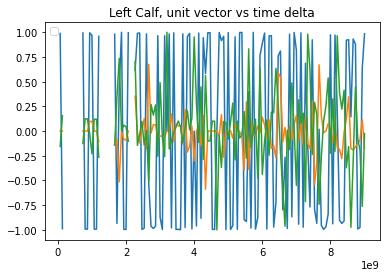

In [44]:
# view rotation axis signals, represented in unit vector [X Y Z]

%matplotlib inline

plt.plot(r_axis['LCA'])
plt.title('Left Calf, unit vector vs time delta')
plt.show();

# it is apparent that the oscillation exits
# this oscillation produces a set of frequency properties which may be extracted using fft
# r_axis['LCA'] is left calf rotation axis plotted against timedelta
# also, it is obvious that at certain point in time, the datapoint not available

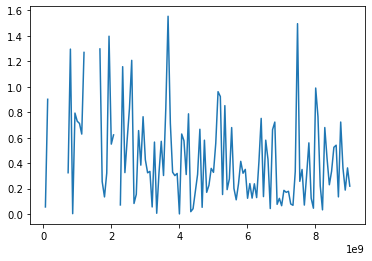

In [45]:
# view rotation angle signal
# timedelta vs radian

plt.plot(r_angle['LCA'])
plt.show();

In [46]:
# DST column is depth (distance from camera), stored only in r_angle dataframe

r_angle

,DST,RSH,RUA,RLA,LSH,LUA,LLA,RHI,RTH,RCA,LHI,LTH,LCA
0 days 00:00:00.067175781,17021.5,NaN,NaN,0.907576,NaN,1.415624,NaN,NaN,NaN,NaN,NaN,NaN,0.055519
0 days 00:00:00.133606201,17255.0,NaN,NaN,0.296325,NaN,0.467223,0.170529,0.867905,1.162070,NaN,1.165519,NaN,0.901191
0 days 00:00:00.200057373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.207725,NaN,NaN,NaN,NaN
0 days 00:00:00.266849121,16567.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.373154,NaN,NaN,0.06348,NaN
0 days 00:00:00.333994385,16567.0,NaN,NaN,1.159425,NaN,NaN,NaN,NaN,NaN,0.691793,NaN,NaN,1.416016
...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:00:09.273409912,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0 days 00:00:09.473757813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0 days 00:00:10.140697266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0 days 00:00:10.207565430,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### The time series data shown in this section is converted to fft signal for training (refer to step 2)

# The End